<a href="https://colab.research.google.com/github/Kaz-K/medical-ai-radiology/blob/master/notebooks/dicom_basics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **医用画像処理の基本 **

本資料はメディカルAI学会公認資格講座における医用画像解析「放射線画像」のための<u>**非公認**</u>の補足資料です。

**DICOM画像の取り扱い**についてソース・コードと共に解説します。

講義で取り上げた**VTK**を用いたサンプルコードについては、Google colabの環境で動作しないためにここでは取り上げません。


## 環境のセットアップ

### ライブラリのインストール

初めに、本補足資料において必要なPythonライブラリをインストールします。ライブラリは以下の通りです。

- **pydicom** : DICOMフォーマットを扱うためのライブラリ
- **matplotlib** : 図表を可視化するためのライブラリ

In [46]:
!pip install matplotlib pydicom

### DICOM画像のダウンロード

次のスクリプトを実行すると、Google colab上の*sample_dicom*というディレクトリに**合計100枚のサンプル用のDICOM画像**がダウンロードされます。

**注意**：サンプル用のDICOM画像は以下のURLより取得したものを、Google colabからアクセス可能なGithub上のファイルとして配置し直したものです。

DICOM Library : https://www.dicomlibrary.com/

In [2]:
!if [ ! -d sample_dicom ]; then curl -L -O https://github.com/Kaz-K/medical-ai-radiology/releases/download/v0.1/sample_dicom.zip && unzip sample_dicom.zip && rm -rf sample_dicom.zip; fi

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   607    0   607    0     0   3570      0 --:--:-- --:--:-- --:--:--  3570
100 21.5M  100 21.5M    0     0  42.1M      0 --:--:-- --:--:-- --:--:-- 42.1M
Archive:  sample_dicom.zip
   creating: sample_dicom/
  inflating: sample_dicom/image-000028.dcm  
  inflating: sample_dicom/image-000000.dcm  
  inflating: sample_dicom/image-000014.dcm  
  inflating: sample_dicom/image-000015.dcm  
  inflating: sample_dicom/image-000001.dcm  
  inflating: sample_dicom/image-000029.dcm  
  inflating: sample_dicom/image-000017.dcm  
  inflating: sample_dicom/image-000003.dcm  
  inflating: sample_dicom/image-000002.dcm  
  inflating: sample_dicom/image-000016.dcm  
  inflating: sample_dicom/image-000012.dcm  
  inflating: sample_dicom/image-000006.dcm  
  inflating: sample_dicom/image-000007.dcm  
  inflating: sample_dicom/image-000013.dcm  


### ファイルの確認

続いて、*sample_dicom*中に正しくファイルが展開されているかどうかを確認し、同時に`file_paths`というリストにDICOMファイルのパスを名前順に格納します。

In [30]:
import os   # オペレーティングシステムに依存したファイル操作を行うためのPython標準ライブラリ

directory_path = './sample_dicom'

file_paths = []
for file_name in sorted(os.listdir(directory_path)):
    print('ファイル名: ', file_name)
    file_paths.append(os.path.join(directory_path, file_name))
  
print('ファイルの総数: ', len(file_paths))

ファイル名:  image-000000.dcm
ファイル名:  image-000001.dcm
ファイル名:  image-000002.dcm
ファイル名:  image-000003.dcm
ファイル名:  image-000004.dcm
ファイル名:  image-000005.dcm
ファイル名:  image-000006.dcm
ファイル名:  image-000007.dcm
ファイル名:  image-000008.dcm
ファイル名:  image-000009.dcm
ファイル名:  image-000010.dcm
ファイル名:  image-000011.dcm
ファイル名:  image-000012.dcm
ファイル名:  image-000013.dcm
ファイル名:  image-000014.dcm
ファイル名:  image-000015.dcm
ファイル名:  image-000016.dcm
ファイル名:  image-000017.dcm
ファイル名:  image-000018.dcm
ファイル名:  image-000019.dcm
ファイル名:  image-000020.dcm
ファイル名:  image-000021.dcm
ファイル名:  image-000022.dcm
ファイル名:  image-000023.dcm
ファイル名:  image-000024.dcm
ファイル名:  image-000025.dcm
ファイル名:  image-000026.dcm
ファイル名:  image-000027.dcm
ファイル名:  image-000028.dcm
ファイル名:  image-000029.dcm
ファイル名:  image-000030.dcm
ファイル名:  image-000031.dcm
ファイル名:  image-000032.dcm
ファイル名:  image-000033.dcm
ファイル名:  image-000034.dcm
ファイル名:  image-000035.dcm
ファイル名:  image-000036.dcm
ファイル名:  image-000037.dcm
ファイル名:  image-000038.dcm
ファイル名:  image-000039.dcm


## DICOM画像の取り扱いについて

### DICOMファイルの読み込みと表示

それでは早速、`file_paths`に含まれる一枚目のDICOM画像を**pydicom**を利用して読み込み、`print`関数によってその中身を表示します。

In [31]:
import pydicom as dicom                # pydicomライブラリをdicomという名前で呼び出す

dcm = dicom.read_file(file_paths[0])   # インデックス0で指定されるリストの最初のDICOMファイルを読み出す

print(dcm)

(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL', 'HELIX']
(0008, 0012) Instance Creation Date              DA: '20061012'
(0008, 0013) Instance Creation Time              TM: '091605.000000'
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.826.0.1.3680043.8.1055.1.20111102150758591.03296050.69180943
(0008, 0020) Study Date                          DA: '20061012'
(0008, 0022) Acquisition Date                    DA: '20061012'
(0008, 0023) Content Date                        DA: '20061012'
(0008, 0030) Study Time                          TM: '090258.000000'
(0008, 0032) Acquisition Time                    TM: '085229.000000'
(0008, 0033) Content Time                        TM: '085229.719000'
(0008, 0060) Modality                            CS: 'CT'
(0008, 1030) Study Description                   LO: 'CT1 abd

### DICOMタグの基本

**DICOM (Digital Imaging and COmmunications in Medicine)**とは、医用画像のフォーマットとそれを扱う医用画像機器間の通信フォーマットについて定めたものです。一つのDICOMファイルは一人の患者の一枚の医用画像に対応し、**DICOMタグ**と呼ばれる指定に従って情報が定義されます。

例えば、上記の`print`関数によって表示された項目から、患者名に相当するDICOMタグに注目すると、

>**`(0010, 0010) Patient's Name                      PN: 'Anonymized'`**

これは次の要素に分解されます。

- **DICOMタグ番号** :  2組の4桁の16進数 (XXXX, YYYY) で表さる。XXXXはグループ番号、YYYYはグループ内番号と呼ばれる。ここでは、`(0010, 0010)` が患者名を指定するDICOMタグ番号となる。
- **名称** : DICOMタグの名称を指し、ここでは`Patient's Name`が該当します。
- **VR (Value Representation)** : DICOMに格納されるデータの形式を定義したもの。ここではPN (= Person Name) と定義された氏名の表現が該当する。
- **値 (Value)** : 格納されるデータであり、ここでは`'Anonymized'`となる。

DICOMに関する解説は、次のJIRAのホームページに分かりやすい資料が数多くありますので、参考にして下さい。

JIRA : http://www.jira-net.or.jp/dicom/dicom_data_01.html

### 基本的な画像情報の確認

続いて、対象となるDICOM画像の基本情報について確認します。

In [32]:
print('画像モダリティ: ', dcm.Modality)
print('行数: ', dcm.Rows)
print('列数: ', dcm.Columns)

画像モダリティ:  CT
行数:  512
列数:  512


上記の情報によって、このDICOM画像はCTであり、512×512ピクセルの画像となっていることが分かります。次のセクションで読み込む`pixel_array`の形状 (`pixel_array.shape`) が実際に`(512, 512)`と一致していることを確認してみて下さい。


---


**注意** : CTとは、水を原点の0、空気を-1000と設定した条件の下で、撮影された組織の密度（X線の被写体内における線減弱係数の分布）を原点の水に対する相対値として表現し、画像化したものです。

CT値に関する解説は様々なサイトがありますが、例えば

CT適塾 : https://www.ct-tekijyuku.net/basic/density/density002.html

などを参考にして下さい。

### Matplotlibを用いたDICOM画像の表示

`dcm`という変数に格納したDICOMオブジェクトから、**NumPy配列**としてピクセル情報を読み出すための属性である`pixel_array`にアクセスします。ここで、**NumPy**とは行列やテンソルなどの多次元のデータ配列を扱うためのPythonのライブラリです。


---


**注意** : DICOM画像が圧縮形式で格納されている場合、**GDCM**と呼ばれる圧縮ファイルを扱うためのライブラリが必要になります。GDCMのインストールのためには、Anacondaが便利です。

インストールについての参考URL : https://anaconda.org/clinicalgraphics/gdcm

圧縮形式の取り扱いについての参考URL : https://pydicom.github.io/pydicom/stable/image_data_handlers.html

pixel_arrayの最大値:  2305
pixel_arrayの最小値:  0


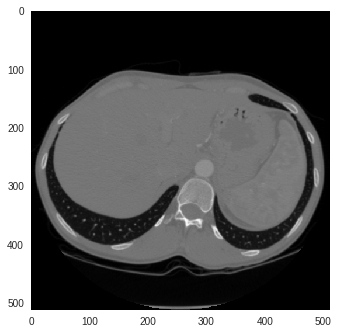

In [33]:
import numpy as np                # numpyライブラリをnpという名前で呼び出し
import matplotlib.pyplot as plt   # 図表可視化用matplotlibライブラリより、pyplotというモジュールをpltという名前で呼び出し

pixel_array = dcm.pixel_array

print('pixel_arrayの最大値: ', np.max(pixel_array))
print('pixel_arrayの最小値: ', np.min(pixel_array))

plt.imshow(pixel_array, cmap='gray')
plt.grid(False)
plt.show()

一見すると、上記の操作によってDICOM画像の表示に問題なく成功しています。<u>しかしながら、`pixel_array`の最小値が0になっている点など、通常は空気において-1000となるはずのCT値との乖離が認められます。</u>

実はDICOM画像においては、`RescaleIntercept`と`RescaleSlope`と呼ばれる2つの値を用いて、`pixel_array`を次のようにスケーリングすることによって、本来の画素値に変換しなければなりません。

> **変換式 : RescaleSlope × pixel_array + RescaleIntercept**

pixel_arrayの最大値:  1305.0
pixel_arrayの最小値:  -1000.0


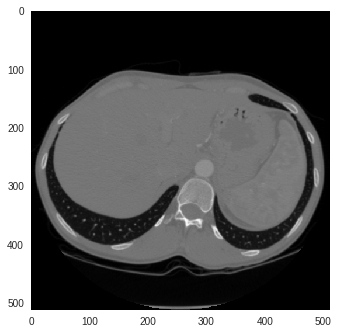

In [34]:
rescale_intercept = dcm.RescaleIntercept
rescale_slope = dcm.RescaleSlope

pixel_array = rescale_slope * pixel_array + rescale_intercept

print('pixel_arrayの最大値: ', np.max(pixel_array))
print('pixel_arrayの最小値: ', np.min(pixel_array))

plt.imshow(pixel_array, cmap='gray')
plt.grid(False)
plt.show()

これにより、普段私達が扱うCT値の範囲に、画素値の取りうる値を収めることが出来たことが確認されました。

最後に、ファイルを指定するパスからDICOMを読み出し、CT値を取り出すまでの流れを関数`get_dicom_image`にまとめます。

---
**注意**：本資料ではDICOMモダリティとしてCTのみ扱っておりますが、DICOMにはX線写真、MRI、核医学検査、超音波、内視鏡画像などの各種の画像検査を格納することが可能です。その場合、必ずしも上記の情報だけでは正確に画素値を取り出すことが出来ないことがあります。

In [0]:
def get_dicom_image(file_path):
    """
    DICOMファイルを指定するファイルパスを引数に取り、スケーリング後の画像を返す関数
    """
    dcm = dicom.read_file(file_path)
    pixel_array = dcm.pixel_array 
  
    rescale_intercept = dcm.RescaleIntercept
    rescale_slope = dcm.RescaleSlope

    return rescale_slope * pixel_array + rescale_intercept

### ウィンドウ機能の実装

目的臓器や周辺の組織をコントラスト良く表示するために、所定の CT 値の範囲（**window width**）と中心 CT 値（**window
center**）を調整するための階調処理を**ウィンドウ機能**と言います。続いてこの機能を実装します。

CTウィンドウに関する参考URL : http://www.startradiology.com/the-basics/x-rayct-technique/

初めに、元画像のCT値が取りうる範囲をヒストグラムによって可視化します。

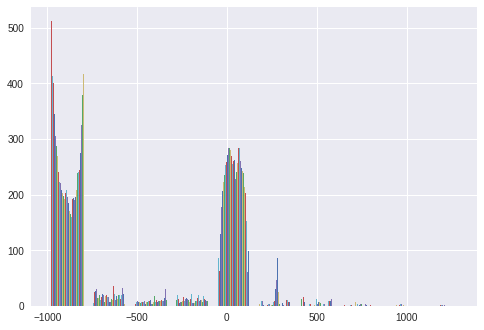

In [36]:
plt.hist(pixel_array)
plt.show()

確かに人体の組織が取りうる値（脂肪：-100、軟部組織：30 - 60、造影した血管内：200 - 300）に多くの値が密集していることが分かります。

続いて、次の関数によって画素値が取りうる値の範囲を指定のwindow widthとwindow centerに従って調整し、更にディスプレイで表示するために求められる濃度域 (0 - 255) にスケーリングします。

In [0]:
def rescale_intensity(image, window_width, window_center):
    """
    画像の階調を変更する
    """
    image = np.copy(image)
    
    max_value = window_center + window_width // 2      # 階調の最大
    min_value = window_center - window_width // 2      # 階調の最小

    image = np.clip(image, min_value, max_value)       # 最小値と最大値の間に収まる値以外をクリップする

    image -= min_value                                 # 階調の最小を0にする
    image /= window_width                              # 階調の最大を1にする
    image *= 255.0                                     # 階調の最大を255にする
    
    return image

この関数を用いて、肝実質の観察に適している**軟部条件** (window center : 0、window width : 400) に`pixel_array`を変換します。

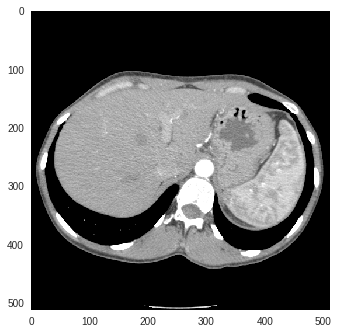

In [38]:
image = rescale_intensity(pixel_array, 400, 0)

plt.imshow(image, cmap='gray')
plt.grid(False)
plt.show()

変換された`image`のヒストグラムを確認すると、確かに値が0から255の範囲に収まっていることが分かります。

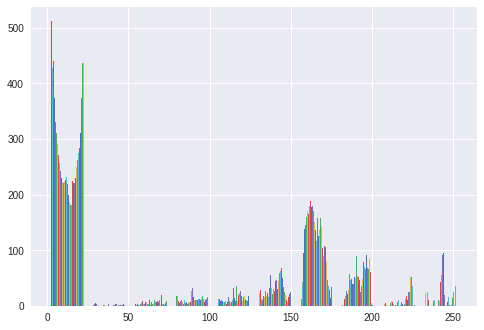

In [39]:
plt.hist(image)
plt.show()

### シリーズとしてのDICOM画像

人体の三次元的な情報を取得するCTやMRIなどの医用画像検査では、一回の検査で複数枚の写真が取得されます。こうしたDICOMのファイルセットは、通常は一つのディレクトリにまとめて保存されます。それぞれのDICOMファイルがどの検査に相当するかどうかは、次の3つのDICOMタグにより階層的な構造を持って指定されます。

- **Study Instatnce UID** : 検査情報
- **Series Instance UID** : シリーズ情報
- **Image SOP Instance UID** : 画像情報

今回のサンプル用DICOMファイルには、Study Instance UIDとSeries Instance UIDは全て共通で、Image SOP Instance UIDの異なる合計100枚の画像が存在していることが期待されます。

In [40]:
study_instance_uids = []
series_instance_uids = []
image_sop_instance_uids = []

for file_path in file_paths:
    dcm = dicom.read_file(file_path)
  
    study_instance_uids.append(dcm.StudyInstanceUID)
    series_instance_uids.append(dcm.SeriesInstanceUID)
    image_sop_instance_uids.append(dcm.SOPInstanceUID)
    
study_instance_uids = set(study_instance_uids)
series_instance_uids = set(series_instance_uids)
image_sop_instance_uids = set(image_sop_instance_uids)

print('ユニークなStudy Instance UIDの数: ', len(study_instance_uids))
print('ユニークなSeries Instance UIDの数: ', len(series_instance_uids))
print('ユニークなImage SOP Instance UIDの数: ', len(image_sop_instance_uids))

ユニークなStudy Instance UIDの数:  1
ユニークなSeries Instance UIDの数:  1
ユニークなImage SOP Instance UIDの数:  100


### CT座標とピクセル座標

それでは、この100枚のCT画像を体軸方向に沿って連続的に表示するにはどのようにしたら良いのでしょうか。

CT画像では、被写体の中心を原点(0, 0)とし、スライス面をxy座標、対軸方向をz座標とした**空間座標（CT座標）**が定められます。この空間座標における方向性は次の通りです。

- **X方向** : 右側から左側に向かって数値が増加する
- **Y方向** : 腹側から背側に向かって数値が増加する
- **Z方向** : 尾側から頭側に向かって数値が増加する

このCT座標は画像中のピクセルの順序を表す正の整数（**ピクセル座標**）とは必ずしも一致していません。CT座標とピクセル座標の関係を求める際に、次の情報を参照する必要があります。

- **Pixel Spacing** : ピクセル座標における一つのピクセルが占めるCT座標における距離
- **Image Orientation (Patient) ** : ピクセル座標の行と列がそれぞれ対応するCT座標における方向余弦（直線が三次元の直交座標において各座標軸となす角のコサインのこと）
- **Image Position (Patient) ** : ピクセル座標の原点に対応するCT座標
- **Slice Thickness** : スライス同士のCT座標における距離
- **Slice Location** : スライス同士の相対的な距離

実際にどのような値が格納されているのかを確認します。

---
CT座標とピクセル座標の変換 : http://nipy.org/nibabel/dicom/dicom_orientation.html

In [41]:
print('Pixel Spacing: ', dcm.PixelSpacing)
print('Image Orientation (Patient): ', dcm.ImageOrientationPatient)
print('Image Position (Patient): ', dcm.ImagePositionPatient)
print('Slice Thickness: ', dcm.SliceThickness)
print('Slice Location: ', dcm.SliceLocation)

Pixel Spacing:  ['0.58984375', '0.58984375']
Image Orientation (Patient):  ['1', '0', '0', '0', '1', '0']
Image Position (Patient):  ['-151.493508', '-36.6564417', '1245.5']
Slice Thickness:  1.0
Slice Location:  -275.50


ここで、`Image Orientation (Patient):  ['1', '0', '0', '0', '1', '0']`となっていることから、ピクセル座標における行方向の方向余弦が`(1, 0, 0)`でX方向に一致し 、列方向の方向余弦が`(0, 1, 0)`でY方向に一致していることが分かります。

この条件において、CT座標とピクセル座標の変換は次のように簡単に表すことが出来ます。

> **CT座標[xyz] = ピクセル座標[ijk] × (Pixel Spacing) + (Image Position Patient)**

これを関数により表現すると次の通りになります。

**注意**：上記のPixel Spacingが二次元のリストであるように、この変換式はスライス面のxy座標に対してのみ有効です。体軸方向のz座標はSlice Location（対軸方向の相対値）あるいはImage Position (Patient) の3つ目の値（体軸方向の絶対値）で指定されることに注意して下さい。

In [0]:
def ij_to_xy(point, pixel_spacing, image_position):
  """
  ピクセル座標を2次元のリスト[i, j]として受け取り、CT座標[x, y]を返す
  """
  point = np.array(point[0:2])
  pixel_spacing = np.array(pixel_spacing[0:2])
  image_position = np.array(image_position[0:2])
  
  return point * pixel_spacing + image_position

def xy_to_ij(point, pixel_spacing, image_position):
  """
  CT座標を3次元のリスト[x, y, z]として受け取り、正の整数の組であるピクセル座標[i, j, k]を返す
  """ 
  point = np.array(point[0:2])
  pixel_spacing = np.array(pixel_spacing[0:2])
  image_position = np.array(image_position[0:2])
  
  return ((point - image_position) / image_position).astype(np.int)

ここまでの知識を前提に、<u>DICOMのファイルセットを体軸方向に並べ替え</u>、順番に表示することによって画像シリーズ全体の可視化を行います。スライスの順番を知るためにはいくつかの方法がありますが、ここでは`Slice Location`の値に基づいた並べ替えを行うこととします。これを実装するために、ファイルパスと`Slice Location`のペアの情報を格納する辞書をリストに格納し、`Slice Location`をキーとして並べ替えます。辞書を要素とするリストにおいて、並べ替えのために特定のキーを指定する際には、`operator`モジュールの`itemgetter`関数が便利です。

In [43]:
from operator import itemgetter 

files_along_zslice = []
for file_path in file_paths:
    dcm = dicom.read_file(file_path)
    slice_location = dcm.SliceLocation 
    files_along_zslice.append({
        'path': file_path, 
        'slice_location': float(slice_location),  
    })
  
files_along_zslice = sorted(files_along_zslice, key=itemgetter('slice_location'))

print(files_along_zslice)

[{'path': './sample_dicom/image-000000.dcm', 'slice_location': -325.0}, {'path': './sample_dicom/image-000001.dcm', 'slice_location': -324.5}, {'path': './sample_dicom/image-000002.dcm', 'slice_location': -324.0}, {'path': './sample_dicom/image-000003.dcm', 'slice_location': -323.5}, {'path': './sample_dicom/image-000004.dcm', 'slice_location': -323.0}, {'path': './sample_dicom/image-000005.dcm', 'slice_location': -322.5}, {'path': './sample_dicom/image-000006.dcm', 'slice_location': -322.0}, {'path': './sample_dicom/image-000007.dcm', 'slice_location': -321.5}, {'path': './sample_dicom/image-000008.dcm', 'slice_location': -321.0}, {'path': './sample_dicom/image-000009.dcm', 'slice_location': -320.5}, {'path': './sample_dicom/image-000010.dcm', 'slice_location': -320.0}, {'path': './sample_dicom/image-000011.dcm', 'slice_location': -319.5}, {'path': './sample_dicom/image-000012.dcm', 'slice_location': -319.0}, {'path': './sample_dicom/image-000013.dcm', 'slice_location': -318.5}, {'pat

今回のデータセットではファイル名と体軸方向の並び順が（たまたま）一致していました。しかしながら、必ずしもこれが常に成り立つとは限らないので、DICOMのファイルセットの扱いの際にはスライスの順序について注意して下さい。

最後に、次のコードによって`Slice Location`順に並び替えたDICOM画像を順番に表示できることを確認して本章を終了とします。

In [45]:
from matplotlib import animation
from matplotlib import rc 
from IPython.display import HTML

fig, ax = plt.subplots()
plt.close()

artists = []
for item in files_along_zslice:
    image = get_dicom_image(item['path'])
    image = rescale_intensity(image, 400, 0)
    im = ax.imshow(image, cmap='gray')
    ax.grid(False)
    artists.append([im])
    
anim = animation.ArtistAnimation(fig, artists, interval=10)
rc('animation', html='jshtml')
anim